In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import folium
from folium import plugins
import ipywidgets
import geocoder
import geopy





In [5]:
day=pd.read_csv("/./Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/DataSet/Bike-Sharing-Dataset/day.csv",parse_dates=["dteday"])
hour=pd.read_csv("/./Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/DataSet/Bike-Sharing-Dataset/hour.csv",parse_dates=["dteday"])
trips_2011=pd.read_csv("/./Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/DataSet/2011-capitalbikeshare-tripdata.csv",parse_dates=["Start date","End date"])
station_loc=pd.read_csv("/./Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/DataSet/Capital_Bike_Share_Locations_updated2.csv",delimiter=";")
station_loc2=pd.read_csv("/./Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/DataSet/Capital_Bike_Share_Locations_updated3.csv",delimiter=";")

DATA SET STATION_LOCATION

In [3]:

station_loc=station_loc.iloc[:,0:9]
station_loc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 697 entries, 0 to 696
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   X               697 non-null    float64
 1   Y               697 non-null    float64
 2   OBJECTID        691 non-null    float64
 3   LATITUDE        697 non-null    float64
 4   LONGITUDE       697 non-null    float64
 5   NAME            697 non-null    object 
 6   STATION_TYPE    695 non-null    object 
 7   STATION_ID      690 non-null    float64
 8   STATION_STATUS  690 non-null    object 
dtypes: float64(6), object(3)
memory usage: 49.1+ KB


DATA SET TRIPS (2011-2012)

In [6]:
# Bike trips 2012
files_2012=glob.glob("/Users/Yanaorfin/Documents/Academy/CapitalBikeShare/DataSet/2012-capitalbikeshare-tripdata/*.csv")
trips_2012=pd.DataFrame()
for file in files_2012:
    data=pd.read_csv(file,parse_dates=["Start date","End date"])
    data["filename"]=file
    trips_2012=pd.concat([trips_2012,data])


In [7]:
trips=trips_2011.append(trips_2012)

/var/folders/0g/qs1_nm7j3n30v6qskgpxqmd80000gn/T/ipykernel_12363/2382772095.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  trips=trips_2011.append(trips_2012)


In [6]:
trips["Duration_min"]=round(trips["Duration"]/60,0)

In [7]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1226767 entries, 0 to 1226766
Data columns (total 10 columns):
 #   Column                Non-Null Count    Dtype         
---  ------                --------------    -----         
 0   Duration              1226767 non-null  int64         
 1   Start date            1226767 non-null  datetime64[ns]
 2   End date              1226767 non-null  datetime64[ns]
 3   Start station number  1226767 non-null  int64         
 4   Start station         1226767 non-null  object        
 5   End station number    1226767 non-null  int64         
 6   End station           1226767 non-null  object        
 7   Bike number           1226767 non-null  object        
 8   Member type           1226767 non-null  object        
 9   Duration_min          1226767 non-null  float64       
dtypes: datetime64[ns](2), float64(1), int64(3), object(4)
memory usage: 93.6+ MB


In [8]:
trips.shape

(1226767, 10)

In [9]:
trips.isna().sum()

Duration                0
Start date              0
End date                0
Start station number    0
Start station           0
End station number      0
End station             0
Bike number             0
Member type             0
Duration_min            0
dtype: int64

In [10]:
trips.isnull().sum()

Duration                0
Start date              0
End date                0
Start station number    0
Start station           0
End station number      0
End station             0
Bike number             0
Member type             0
Duration_min            0
dtype: int64

In [11]:
#trips.drop(columns=["filename"],inplace=True)

In [12]:
trips.loc[trips["Member type"]=="Member","Member type"]="registered"
trips.loc[trips["Member type"]=="Casual","Member type"]="casual"

In [13]:
# Routes
trips["route"]=trips["Start station"]+" - "+trips["End station"]

In [14]:
# Replace Unknown memeber type (<1%)
trips["Member type"].replace({"Unknown":"casual"},inplace=True)

DAY & HOUR  DATA SET

In [15]:
day.shape

(731, 16)

In [16]:
day.info()
day.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     731 non-null    int64         
 1   dteday      731 non-null    datetime64[ns]
 2   season      731 non-null    int64         
 3   yr          731 non-null    int64         
 4   mnth        731 non-null    int64         
 5   holiday     731 non-null    int64         
 6   weekday     731 non-null    int64         
 7   workingday  731 non-null    int64         
 8   weathersit  731 non-null    int64         
 9   temp        731 non-null    float64       
 10  atemp       731 non-null    float64       
 11  hum         731 non-null    float64       
 12  windspeed   731 non-null    float64       
 13  casual      731 non-null    int64         
 14  registered  731 non-null    int64         
 15  cnt         731 non-null    int64         
dtypes: datetime64[ns](1), floa

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [17]:
hour.shape

(17379, 17)

In [18]:
hour.info()
hour.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   dteday      17379 non-null  datetime64[ns]
 2   season      17379 non-null  int64         
 3   yr          17379 non-null  int64         
 4   mnth        17379 non-null  int64         
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  int64         
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  int64         
 9   weathersit  17379 non-null  int64         
 10  temp        17379 non-null  float64       
 11  atemp       17379 non-null  float64       
 12  hum         17379 non-null  float64       
 13  windspeed   17379 non-null  float64       
 14  casual      17379 non-null  int64         
 15  registered  17379 non-null  int64         
 16  cnt         17379 non-

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [19]:
hour.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [20]:
hour.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [21]:
hour.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

ADDING DATE/TIME FEATURES  TO  TRIPS, HOUR, DAY DATA SETS 

In [22]:
hour.loc[hour["season"]==1,"season_name"]="Winter"
hour.loc[hour["season"]==2,"season_name"]="Spring"
hour.loc[hour["season"]==3,"season_name"]="Summer"
hour.loc[hour["season"]==4,"season_name"]="Fall"

day.loc[day["season"]==1,"season_name"]="Winter"
day.loc[day["season"]==2,"season_name"]="Spring"
day.loc[day["season"]==3,"season_name"]="Summer"
day.loc[day["season"]==4,"season_name"]="Fall"


In [23]:
pd.to_datetime(hour["dteday"])

0       2011-01-01
1       2011-01-01
2       2011-01-01
3       2011-01-01
4       2011-01-01
           ...    
17374   2012-12-31
17375   2012-12-31
17376   2012-12-31
17377   2012-12-31
17378   2012-12-31
Name: dteday, Length: 17379, dtype: datetime64[ns]

In [8]:

pd.to_datetime(trips["Start date"])
pd.to_datetime(trips["End date"])

0         2011-01-01 01:00:37
1         2011-01-01 00:08:32
2         2011-01-01 00:15:36
3         2011-01-01 00:16:36
4         2011-01-01 00:32:19
                  ...        
1226762   2011-12-31 23:46:20
1226763   2011-12-31 23:53:10
1226764   2011-12-31 23:51:49
1226765   2012-01-01 00:29:33
1226766   2012-01-01 00:03:45
Name: End date, Length: 1226767, dtype: datetime64[ns]

In [25]:
trips["mnth"]=pd.DatetimeIndex(trips["Start date"]).month
trips["weekday"]=pd.DatetimeIndex(trips["Start date"]).weekday
trips["dteday"]=pd.DatetimeIndex(trips["Start date"]).date
trips["hour"]=trips["Start date"].dt.hour


In [26]:
# Day time
# Trips data set
trips["day_time"]=trips["hour"]

trips["day_time"]=np.where((trips["hour"]>=0)&(trips["hour"]<5),"Night",trips["day_time"])
trips["day_time"]=np.where((trips["hour"]>=5)&(trips["hour"]<7),"Early morning",trips["day_time"])
trips["day_time"]=np.where((trips["hour"]>=7)&(trips["hour"]<12),"Morning",trips["day_time"])
trips["day_time"]=np.where((trips["hour"]>=12)&(trips["hour"]<17),"Afternoon",trips["day_time"])
trips["day_time"]=np.where((trips["hour"]>=17)&(trips["hour"]<21),"Evening",trips["day_time"])
trips["day_time"]=np.where((trips["hour"]>=21)&(trips["hour"]<24),"Night",trips["day_time"])


# Hour data set

hour["day_time"]=hour["hr"]

hour["day_time"]=np.where((hour["hr"]>=0)&(hour["hr"]<5),"Night",hour["day_time"])
hour["day_time"]=np.where((hour["hr"]>=5)&(hour["hr"]<7),"Early morning",hour["day_time"])
hour["day_time"]=np.where((hour["hr"]>=7)&(hour["hr"]<12),"Morning",hour["day_time"])
hour["day_time"]=np.where((hour["hr"]>=12)&(hour["hr"]<17),"Afternoon",hour["day_time"])
hour["day_time"]=np.where((hour["hr"]>=17)&(hour["hr"]<21),"Evening",hour["day_time"])
hour["day_time"]=np.where((hour["hr"]>=21)&(hour["hr"]<24),"Night",hour["day_time"])


In [27]:
trips["dteday"]=pd.to_datetime(trips["dteday"])

In [28]:

# HOUR DF
hour["season_name"]=pd.Categorical(hour["season_name"],categories=("Winter","Spring","Summer","Fall"))
hour["is_holiday"]=hour["holiday"]
hour.loc[hour["is_holiday"]==1,"is_holiday"]="Yes"
hour.loc[hour["is_holiday"]==0,"is_holiday"]="No"
hour["is_holiday"]=pd.Categorical(hour["is_holiday"],categories=("Yes","No"))

#DAY DF

day["season_name"]=pd.Categorical(day["season_name"],categories=("Winter","Spring","Summer","Fall"))
day["is_holiday"]=day["holiday"]
day.loc[day["is_holiday"]==1,"is_holiday"]="Yes"
day.loc[day["is_holiday"]==0,"is_holiday"]="No"
day["is_holiday"]=pd.Categorical(day["is_holiday"],categories=("Yes","No"))


#TRIPS DF

trips["season"]=trips["mnth"]
trips["season_name"]=trips["season"]
trips["season_name"].replace({1:"Winter",2:"Winter",3:"Spring",4:"Spring",5:"Spring",6:"Summer",7:"Summer",8:"Summer",9:"Fall",10:"Fall",11:"Fall",12:"Winter"},inplace=True)
trips["season_name"]=pd.Categorical(trips["season_name"],categories=("Winter","Spring","Summer","Fall"))


In [29]:
#weekday name

hour["day_name"]=hour["weekday"]
hour["day_name"].replace({0:"Sun",1:"Mon",2:"Tue",3:"Wed",4:"Thu",5:"Fri",6:"Sat"},inplace=True)
trips["day_name"]=trips["weekday"]
trips["day_name"].replace({0:"Sun",1:"Mon",2:"Tue",3:"Wed",4:"Thu",5:"Fri",6:"Sat"},inplace=True)

In [30]:
# Holiday colummn for "Trips" dataset
holiday_list=day[["dteday","holiday","is_holiday"]]
trips=pd.merge(trips,holiday_list,on="dteday",how="left")

In [31]:
hour.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [32]:
trips.describe()

,Duration,Start station number,End station number,Duration_min,mnth,weekday,hour,season,holiday
count,1.226767e+06,1.226767e+06,1.226767e+06,1.226767e+06,1.226767e+06,1.226767e+06,1.226767e+06,1.226767e+06,1.226767e+06
mean,1.179553e+03,3.128718e+04,3.128847e+04,1.965914e+01,7.150331e+00,3.001439e+00,1.419177e+01,7.150331e+00,2.417737e-02
std,2.475419e+03,1.933420e+02,1.924823e+02,4.125806e+01,2.932338e+00,2.006915e+00,5.067389e+00,2.932338e+00,1.535996e-01
min,6.000000e+01,3.100000e+04,3.100000e+04,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00
25%,4.150000e+02,3.120000e+04,3.120000e+04,7.000000e+00,5.000000e+00,1.000000e+00,1.000000e+01,5.000000e+00,0.000000e+00
50%,6.830000e+02,3.122000e+04,3.122000e+04,1.100000e+01,7.000000e+00,3.000000e+00,1.500000e+01,7.000000e+00,0.000000e+00
75%,1.133000e+03,3.140100e+04,3.140100e+04,1.900000e+01,1.000000e+01,5.000000e+00,1.800000e+01,1.000000e+01,0.000000e+00
max,8.635500e+04,3.180600e+04,3.180600e+04,1.439000e+03,1.200000e+01,6.000000e+00,2.300000e+01,1.200000e+01,1.000000e+00


WEATHER SCORE FOR HOUR\DAY DATA SET 

In [33]:
# Normalised values to meaningful values

# HOUR DF
hour["tem_cel"]=np.ceil(hour["temp"]*47-8).astype(int)
hour["atemp_cel"]=np.ceil(hour["atemp"]*66-16).astype(int)
hour["windspeed_"]=np.ceil(hour["windspeed"]*67).astype(int)

# DAY DF
day["tem_cel"]=np.ceil(day["temp"]*47-8).astype(int)
day["atemp_cel"]=np.ceil(day["atemp"]*66-16).astype(int)
day["windspeed_"]=np.ceil(day["windspeed"]*67).astype(int)

In [34]:
# Weather score
hour["hum_score"]=hour["hum"]
hour["temp_score"]=hour["tem_cel"]
hour["wind_score"]=hour["windspeed_"]


hour["hum_score"]=np.where(hour["hum_score"]>=0.78,4,hour["hum_score"])
hour["hum_score"]=np.where((hour["hum_score"]>=0.63)&(hour["hum_score"]<0.78),3,hour["hum_score"])
hour["hum_score"]=np.where((hour["hum_score"]>=0.48)&(hour["hum_score"]<0.63),2,hour["hum_score"])
hour["hum_score"]=np.where(hour["hum_score"]<0.48,1,hour["hum_score"])


hour["temp_score"]=np.where((hour["temp_score"]>=0)&(hour["temp_score"]<10),3,hour["temp_score"])
hour["temp_score"]=np.where((hour["temp_score"]>=10)&(hour["temp_score"]<16),2,hour["temp_score"])
hour["temp_score"]=np.where((hour["temp_score"]>=25)&(hour["temp_score"]<30),2,hour["temp_score"])
hour["temp_score"]=np.where((hour["temp_score"]>=16)&(hour["temp_score"]<25),1,hour["temp_score"])
hour["temp_score"]=np.where(hour["temp_score"]>=30,4,hour["temp_score"])
hour["temp_score"]=np.where(hour["temp_score"]<0,4,hour["temp_score"])


hour["wind_score"]=np.where((hour["wind_score"]>=0)&(hour["wind_score"]<13),1,hour["wind_score"])
hour["wind_score"]=np.where((hour["wind_score"]>=13)&(hour["wind_score"]<25),2,hour["wind_score"])
hour["wind_score"]=np.where((hour["wind_score"]>=25)&(hour["wind_score"]<39),3,hour["wind_score"])
hour["wind_score"]=np.where((hour["wind_score"]>=39),4,hour["wind_score"])

hour["weather_score"]=((hour["temp_score"]*0.4)+(hour["hum_score"]*0.3)+(hour["wind_score"]*0.1)+(hour["weathersit"]*0.2))


EDA (HOUR DF)

The impact of the weather condition  on the amount of trips

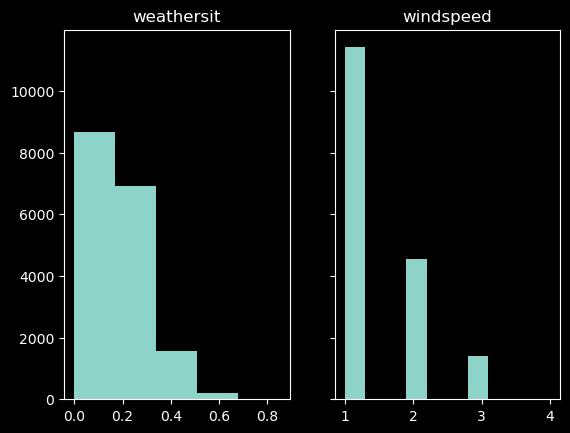

In [35]:
plt.style.use("dark_background")
fig,axs=plt.subplots(1,2,sharey=True)
axs[0].set_title("weathersit")
axs[1].set_title("windspeed")

axs[0].hist(hour["windspeed"],bins=5)
axs[1].hist(hour["weathersit"],bins=10)

plt.show()

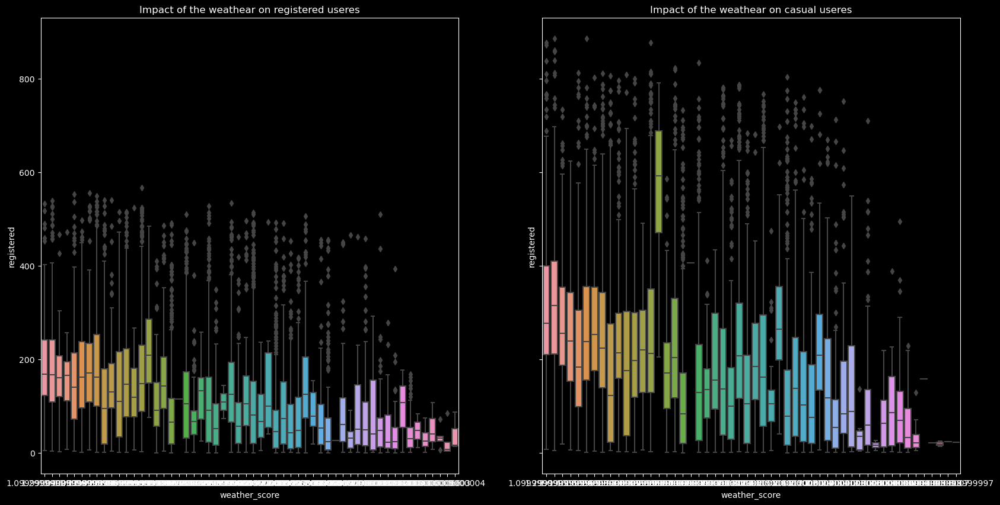

In [36]:

fig,axs=plt.subplots(1,2,figsize=(20,10),sharey=True)
axs[0].set_xlim(1,4)
axs[0].set_xticks(range(1,4))
axs[1].set_xlim(1,4)
axs[1].set_xticks(range(1,4))
axs[0].set_title("Impact of the weathear on registered useres")
axs[1].set_title("Impact of the weathear on casual useres")

sns.boxplot(data=hour[hour["yr"]==0],y="registered",x="weather_score",ax=axs[0])
sns.boxplot(data=hour[hour["yr"]==1],y="registered",x="weather_score",ax=axs[1])
plt.show()

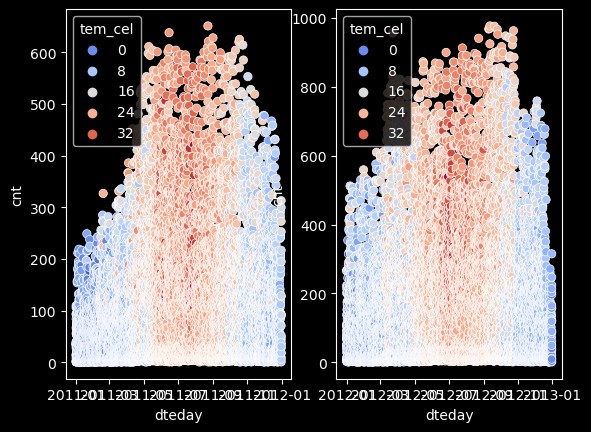

In [94]:
# Scatter plot df
n_subplot = 2
fig,axs=plt.subplots(1,n_subplot)
def multiple_custom_scatterplot(data,x,y,axis=None,hue={},palette={}):
    if axis is None:
        axis = plt.gca()
    sns.scatterplot(data=data,x=x,y=y,hue=hue,palette=palette, ax=axs[axis])
for i in range(0,n_subplot):
    multiple_custom_scatterplot(hour[hour["yr"]==i],"dteday","cnt", i,"tem_cel","coolwarm")
    # multiple_custom_scatterplot(hour[hour["yr"]==1],"dteday","cnt",1,"tem_cel","coolwarm")
plt.show()

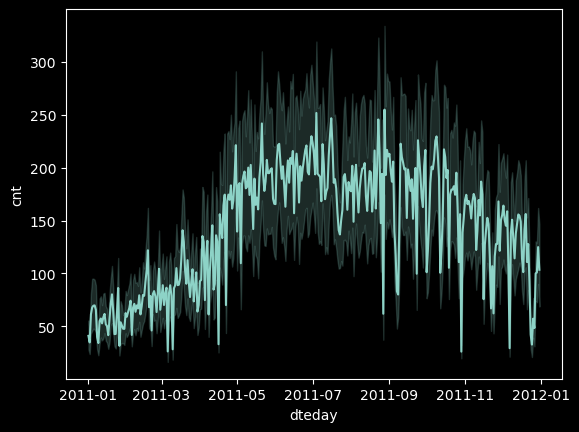

In [98]:

def test(chart_type, data, x, y):
    chart_type(data=data, x=x, y=y)
test(sns.lineplot,hour[hour["yr"]==0],"dteday","cnt" )

In [39]:
def custom_plot(x, y, ax=None, **plt_kwargs):
    if ax is None:
        ax = plt.gca()
    ax.plot(x, y, **plt_kwargs) ## example plot here
    return(ax)

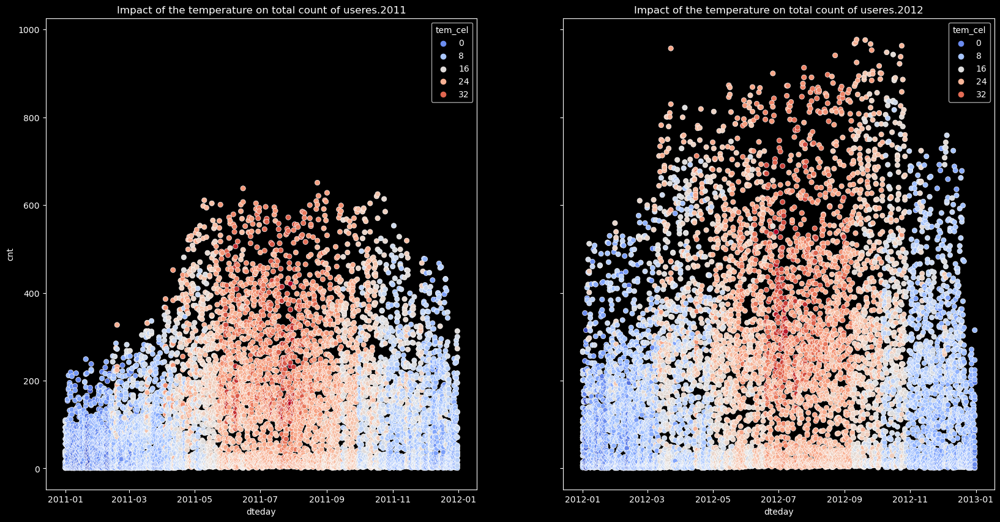

In [40]:

fig,axs=plt.subplots(1,2,figsize=(20,10),sharey=True)
axs[0].set_title("Impact of the temperature on total count of useres.2011")
axs[1].set_title("Impact of the temperature on total count of useres.2012")
sns.scatterplot(data=hour[hour["yr"]==0],y="cnt",x="dteday",hue="tem_cel",palette="coolwarm",ax=axs[0])
sns.scatterplot(data=hour[hour["yr"]==1],y="cnt",x="dteday",hue="tem_cel",palette="coolwarm",ax=axs[1])
plt.show()

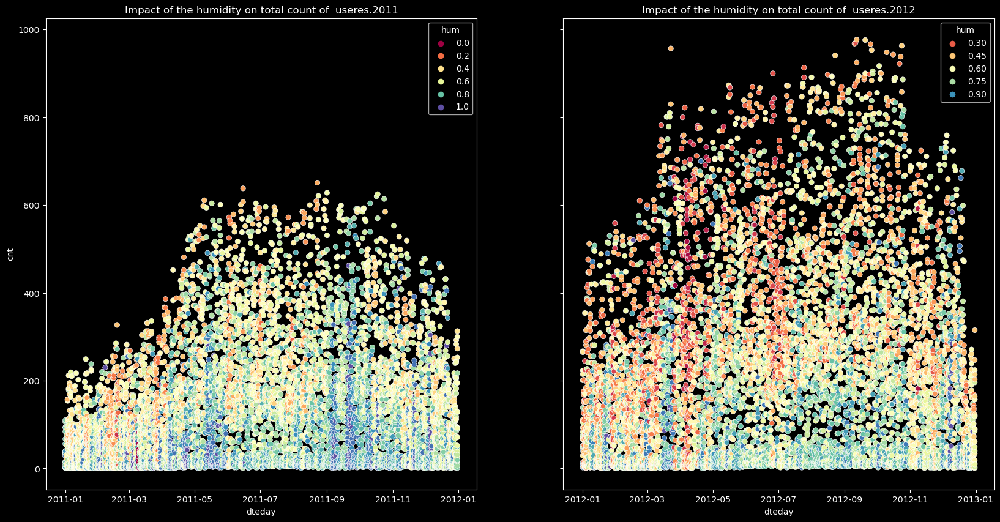

In [41]:

fig,axs=plt.subplots(1,2,figsize=(20,10),sharey=True)
axs[0].set_title("Impact of the humidity on total count of  useres.2011")
axs[1].set_title("Impact of the humidity on total count of  useres.2012")

sns.scatterplot(data=hour[hour["yr"]==0],y="cnt",x="dteday",hue="hum",palette="Spectral",ax=axs[0],hue_order=range(0,1))
sns.scatterplot(data=hour[hour["yr"]==1],y="cnt",x="dteday",hue="hum",palette="Spectral",ax=axs[1],hue_order=range(0,1))
plt.show()

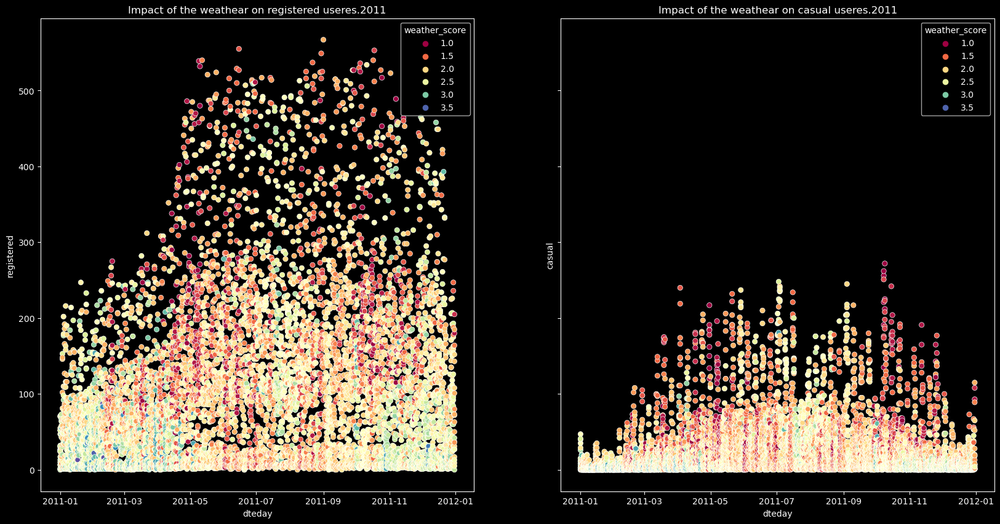

In [42]:
#Impact of the weathear on registered & casual useres.2011
fig,axs=plt.subplots(1,2,figsize=(20,10),sharey=True)
axs[0].set_ylabel("registered")
axs[1].set_ylabel("casual")
axs[0].set_title("Impact of the weathear on registered useres.2011")
axs[1].set_title("Impact of the weathear on casual useres.2011")

sns.scatterplot(data=hour[hour["yr"]==0],y="registered",x="dteday",hue="weather_score",palette="Spectral",ax=axs[0],hue_order=range(0,1))
sns.scatterplot(data=hour[hour["yr"]==0],y="casual",x="dteday",hue="weather_score",palette="Spectral",ax=axs[1],hue_order=range(0,1))
plt.show()

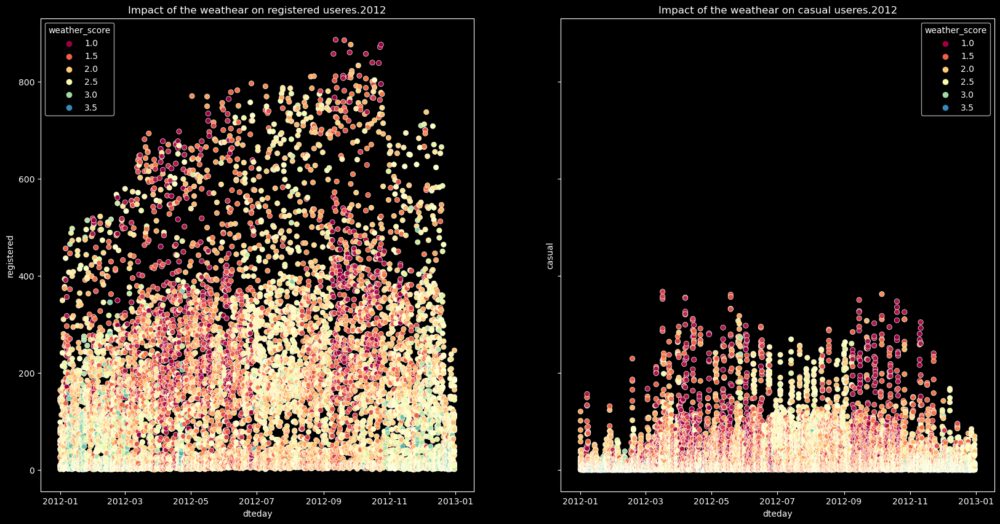

In [43]:
#Impact of the weathear on registered & casual useres.2012
fig,axs=plt.subplots(1,2,figsize=(20,10),sharey=True)

axs[0].set_ylabel("registered")
axs[1].set_ylabel("casual")
axs[0].set_title("Impact of the weathear on registered useres.2012")
axs[1].set_title("Impact of the weathear on casual useres.2012")

sns.scatterplot(data=hour[hour["yr"]==1],y="registered",x="dteday",hue="weather_score",palette="Spectral",ax=axs[0],hue_order=range(0,1))
sns.scatterplot(data=hour[hour["yr"]==1],y="casual",x="dteday",hue="weather_score",palette="Spectral",ax=axs[1],hue_order=range(0,1))
plt.show()

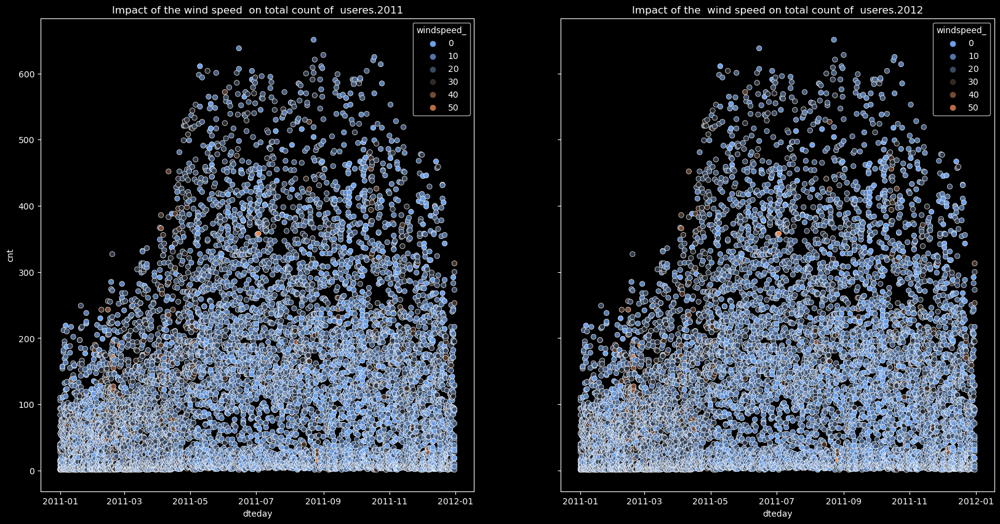

In [44]:
#Impact of the wind speed  on total count of  useres.2011-2012
fig,axs=plt.subplots(1,2,figsize=(20,10),sharey=True)

my_palette=sns.diverging_palette(250, 30, l=65, center="dark", as_cmap=True)
axs[0].set_title("Impact of the wind speed  on total count of  useres.2011")
axs[1].set_title("Impact of the  wind speed on total count of  useres.2012")
sns.scatterplot(data=hour[hour["yr"]==0],y="cnt",x="dteday",hue="windspeed_",palette=my_palette,ax=axs[0],hue_order=range(0,60))
sns.scatterplot(data=hour[hour["yr"]==0],y="cnt",x="dteday",hue="windspeed_",palette=my_palette,ax=axs[1],hue_order=range(0,60))
plt.show()

HEAT MAP

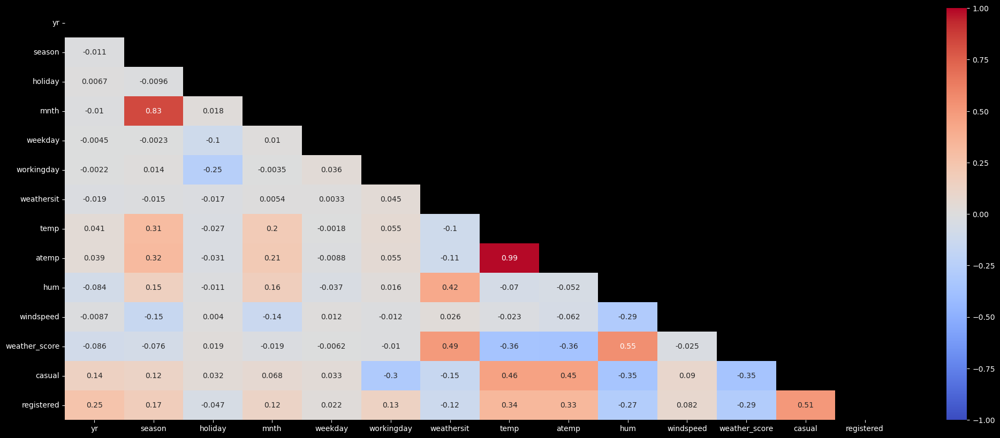

In [45]:
# Hour df heat map

fig,axs=plt.subplots(figsize=(25,10))

hour_df=hour[["yr","season","holiday","mnth","weekday","workingday","weathersit","temp","atemp","hum","windspeed","weather_score","casual","registered"]]
matrix_hour_df=hour_df.corr()

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(matrix_hour_df, dtype=bool))

sns.heatmap(data=matrix_hour_df,cmap="coolwarm",vmin=-1,vmax=1,robust=True,square=False,annot=True,mask=mask)
plt.show()


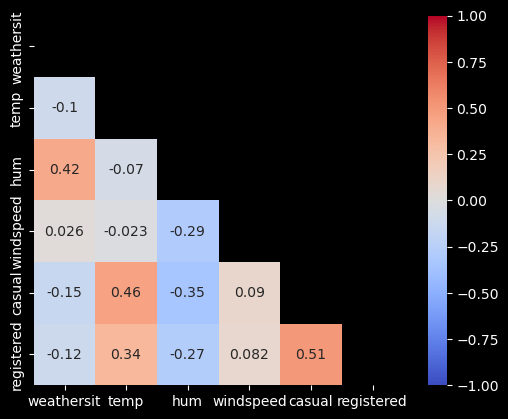

In [46]:
# Weather heat map


weather=hour[["weathersit","temp","hum","windspeed","casual","registered"]].copy()

matrix_weather=weather.corr()

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(matrix_weather, dtype=bool))

sns.heatmap(data=matrix_weather,cmap="coolwarm",vmin=-1,vmax=1,robust=True,square=True,annot=True,mask=mask)
plt.show()

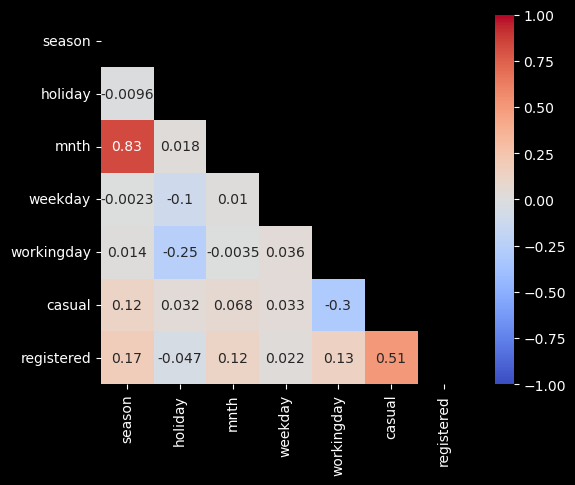

In [47]:
# Period heat map
period=hour[["season","holiday","mnth","weekday","workingday","casual","registered"]].copy()

matrix_period=period.corr()

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(matrix_period, dtype=bool))

sns.heatmap(data=matrix_period,cmap="coolwarm",vmin=-1,robust=True,vmax=1,square=True,annot=True,mask=mask)
plt.show()

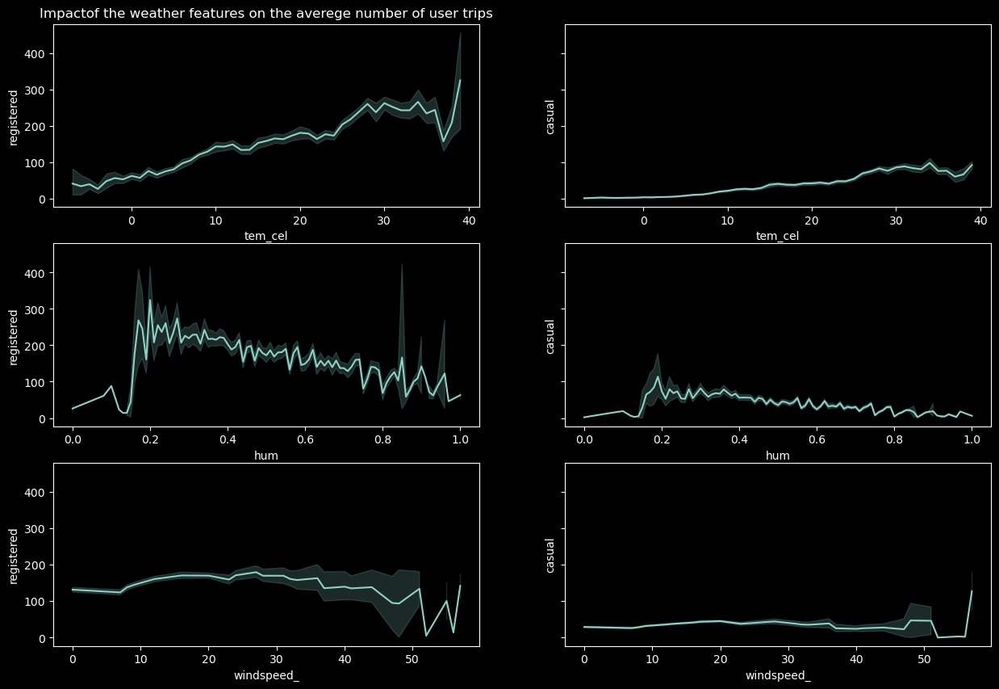

In [48]:
#Impact of the weather features on the averege number of user trips

fig,axs=plt.subplots(3,2,figsize=(15,10),sharey=True)
axs[0,0].set_title("Impactof the weather features on the averege number of user trips")
axs[0,0].set_ylabel("registered")
axs[0,1].set_ylabel("casual")
axs[1,0].set_ylabel("registered")
axs[1,1].set_ylabel("casual")
axs[2,0].set_ylabel("registered")
axs[2,1].set_ylabel("casual")

sns.lineplot(data=hour,x="tem_cel",y="registered",palette="coolwarm",ax=axs[0,0],estimator=np.mean)
sns.lineplot(data=hour,x="tem_cel",y="casual",palette="coolwarm",ax=axs[0,1],estimator=np.mean)
sns.lineplot(data=hour,x="hum",y="registered",palette="coolwarm",ax=axs[1,0],estimator=np.mean)
sns.lineplot(data=hour,x="hum",y="casual",palette="coolwarm",ax=axs[1,1],estimator=np.mean)
sns.lineplot(data=hour,x="windspeed_",y="registered",palette="coolwarm",ax=axs[2,0],estimator=np.mean)
sns.lineplot(data=hour,x="windspeed_",y="casual",palette="coolwarm",ax=axs[2,1],estimator=np.mean)

plt.show()

Impact of the month/weekday/hour   on the amount of trips

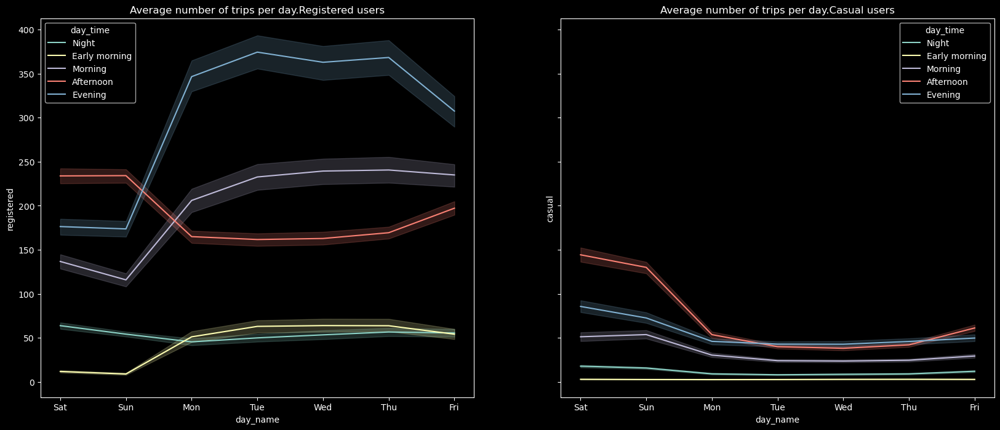

In [49]:
fig,axs=plt.subplots(1,2,figsize=(20,8),sharey=True)
axs[0].set_title("Average number of trips per day.Registered users")
axs[1].set_title("Average number of trips per day.Casual users")
axs[0].set_ylabel("registered")
axs[1].set_ylabel("casual")
sns.lineplot(data=hour,x="day_name",y="registered",hue="day_time",markers=True,estimator=np.mean,ax=axs[0])
sns.lineplot(data=hour,x="day_name",y="casual",hue="day_time",markers=True,estimator=np.mean,ax=axs[1])
plt.show()

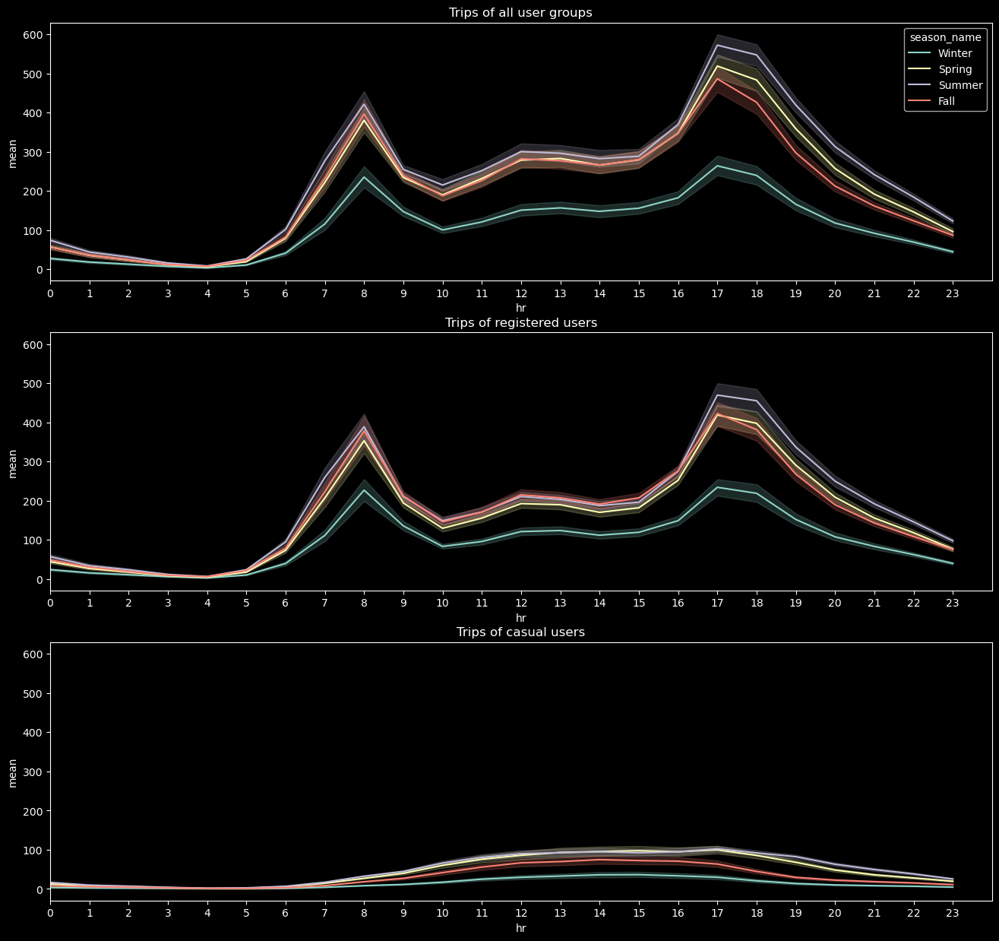

In [50]:
# The most popular hours to rent the bike 
fig,axs=plt.subplots(3,1,figsize=(16,15),sharey=True)
axs[0].set_title("Trips of all user groups")
axs[2].set_title("Trips of casual users")
axs[1].set_title("Trips of registered users")
axs[0].set(xlabel="",ylabel="mean")
axs[2].set(xlabel="",ylabel="mean")
axs[1].set(xlabel="",ylabel="mean")
axs[0].set_xlim(0,24)
axs[0].set_xticks(range(0,24))
axs[1].set_xlim(0,24)
axs[1].set_xticks(range(0,24))
axs[2].set_xlim(0,24)
axs[2].set_xticks(range(0,24))
sns.lineplot(data=hour,x="hr",y="cnt",hue="season_name",markers=True,estimator=np.mean,ax=axs[0])
sns.lineplot(data=hour,x="hr",y="registered",hue="season_name",markers=True,estimator=np.mean,ax=axs[1],legend=None)
sns.lineplot(data=hour,x="hr",y="casual",hue="season_name",markers=True,estimator=np.mean,ax=axs[2],legend=None)


plt.show()

NEW DF for HOURS (unpivoted)
a format where features are id_vars, while "user's type", considered as  value_vars

In [51]:
hours_melt=pd.melt(hour,id_vars=["instant","dteday","day_name","season_name","yr","mnth","hr","holiday","weekday","workingday","weathersit","tem_cel","atemp_cel","hum","windspeed_","is_holiday","weather_score","day_time"],value_vars=["casual","registered"])

CHARTS BASED ON UNPIVOTED DF

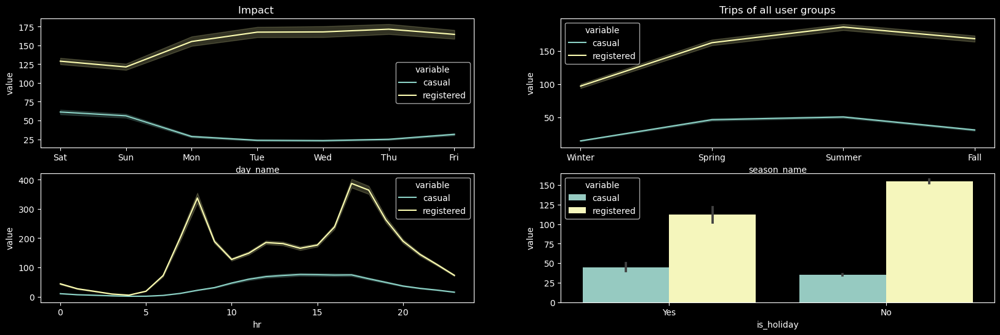

In [52]:

fig,axs=plt.subplots(2,2,figsize=(20,6))
axs[0,0].set_title("Impact ")
axs[0,1].set_title("Trips of all user groups")
sns.lineplot(data=hours_melt,x="day_name",y="value",hue="variable",estimator=np.mean,ax=axs[0,0])
sns.lineplot(data=hours_melt,x="season_name",y="value",hue="variable",estimator=np.mean,ax=axs[0,1])
sns.lineplot(data=hours_melt,x="hr",y="value",hue="variable",estimator=np.mean,ax=axs[1,0])
sns.barplot(data=hours_melt,x="is_holiday",y="value",hue="variable",estimator=np.mean,ax=axs[1,1])
plt.show()


<AxesSubplot:title={'center':'Average number of trips per day.Depending on day type'}, xlabel='is_holiday', ylabel='value'>

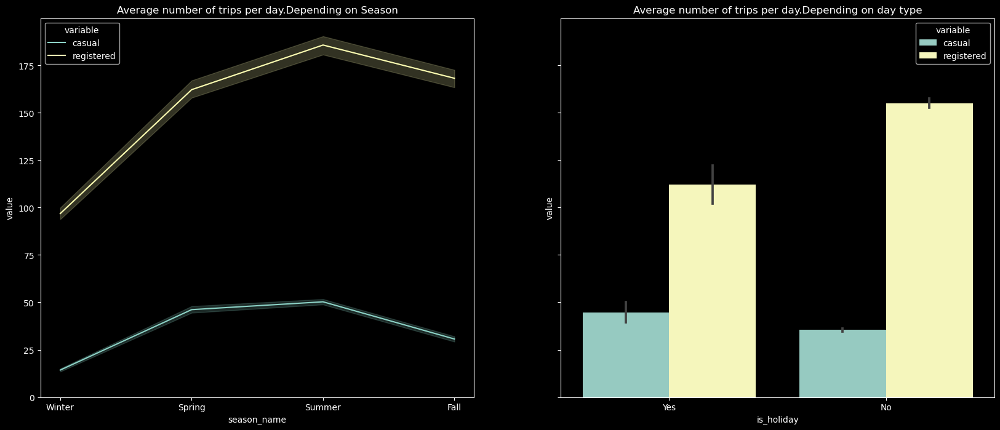

In [53]:
fig,axs=plt.subplots(1,2,figsize=(20,8),sharey=True)
axs[0].set_title("Average number of trips per day.Depending on Season")
axs[1].set_title("Average number of trips per day.Depending on day type")
sns.lineplot(data=hours_melt,x="season_name",y="value",hue="variable",estimator=np.mean,ax=axs[0])
sns.barplot(data=hours_melt,x="is_holiday",y="value",hue="variable",estimator=np.mean,ax=axs[1])

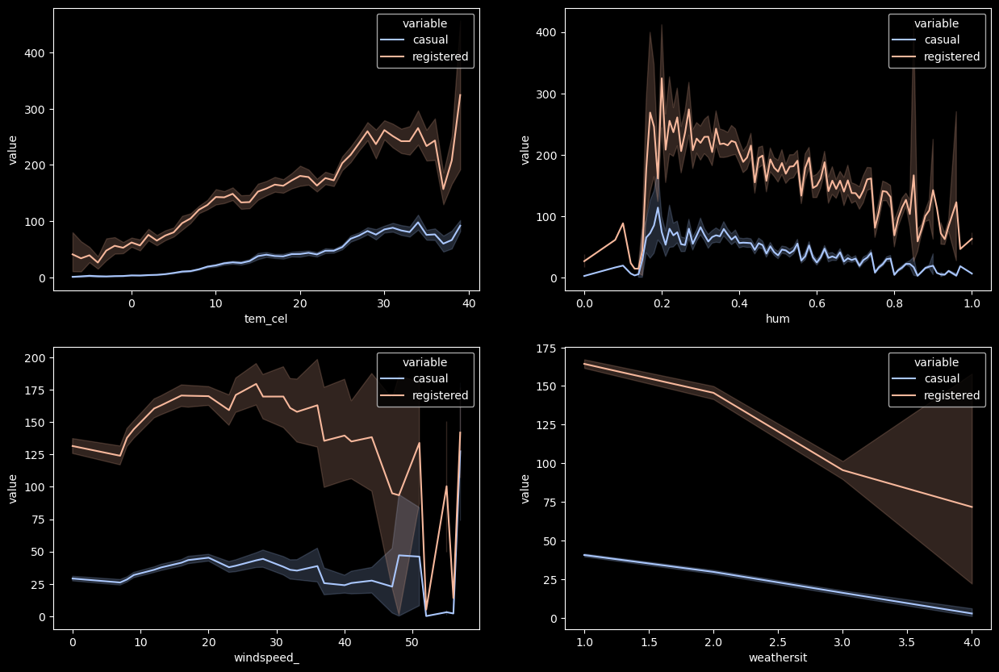

In [54]:
fig,axs=plt.subplots(2,2,figsize=(15,10))
sns.lineplot(data=hours_melt,x="tem_cel",y="value",palette="coolwarm",ax=axs[0,0],estimator=np.mean,hue="variable")
sns.lineplot(data=hours_melt,x="hum",y="value",palette="coolwarm",ax=axs[0,1],estimator=np.mean,hue="variable")
sns.lineplot(data=hours_melt,x="windspeed_",y="value",palette="coolwarm",ax=axs[1,0],estimator=np.mean,hue="variable")
sns.lineplot(data=hours_melt,x="weathersit",y="value",palette="coolwarm",ax=axs[1,1],estimator=np.mean,hue="variable")


plt.show()

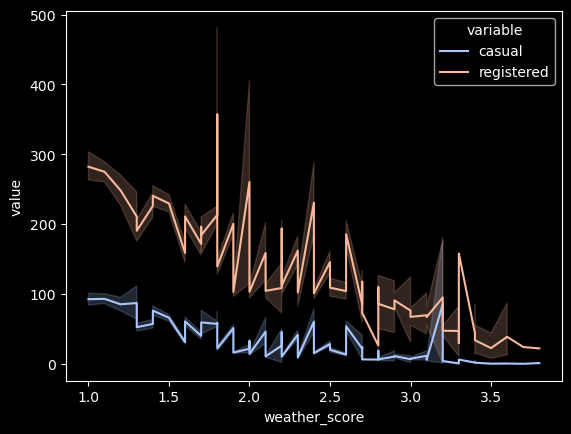

In [55]:
# WEATHER SCORE
sns.lineplot(data=hours_melt,x="weather_score",y="value",palette="coolwarm",estimator=np.mean,hue="variable")
plt.show()

EDA TRIPS DF

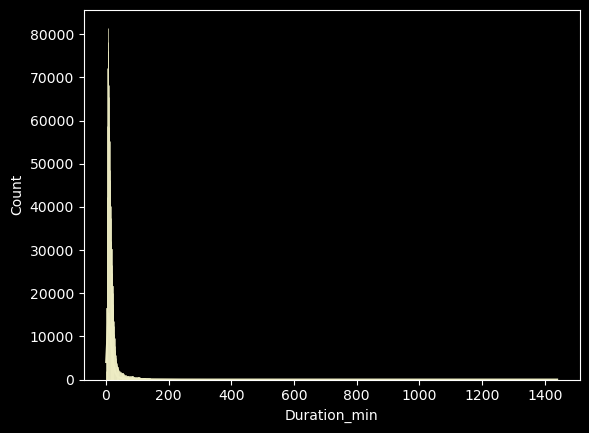

In [56]:
sns.histplot(data=trips,x="Duration_min",color='#EEEDC4',label="Duration_min",edgecolor='#EEEDC4', linewidth=0.5,kde=True)
plt.style.use("dark_background")

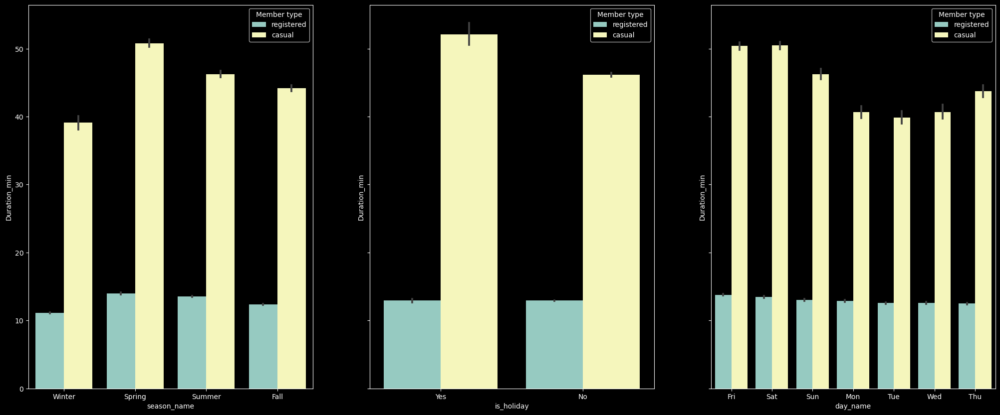

In [57]:
# AVERAGE TRIP DURATION
fig,axs=plt.subplots(1,3,figsize=(25,10),sharey=True)
sns.barplot(data=trips,x="season_name",y="Duration_min",estimator=np.mean,hue="Member type",ax=axs[0])
sns.barplot(data=trips,x="is_holiday",y="Duration_min",estimator=np.mean,hue="Member type",ax=axs[1])
sns.barplot(data=trips,x="day_name",y="Duration_min",estimator=np.mean,hue="Member type",ax=axs[2])
plt.show()

<AxesSubplot:xlabel='Member type', ylabel='count'>

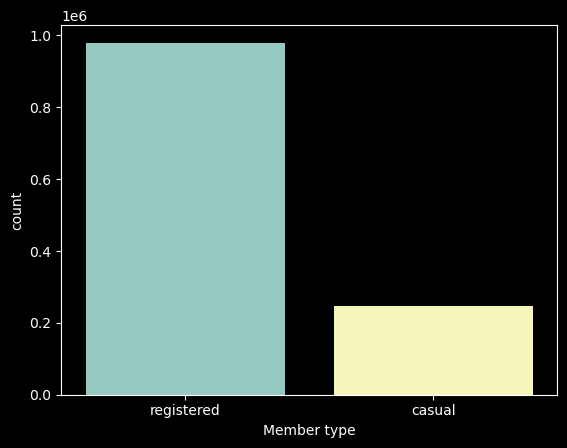

In [58]:
sns.countplot(data=trips,x="Member type")

<AxesSubplot:xlabel='Member type', ylabel='count'>

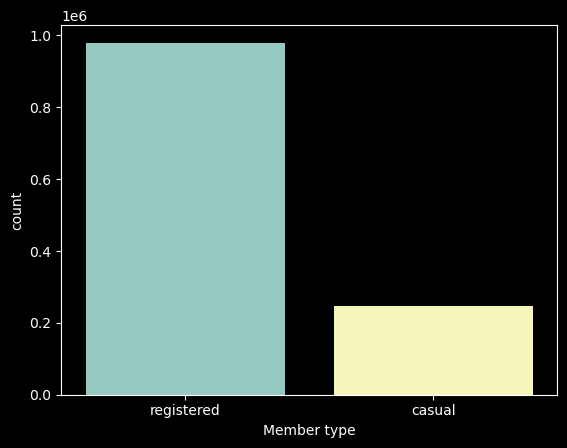

In [59]:
sns.countplot(data=trips,x="Member type")


Popular routs & stations

Fix misspel in station name

In [60]:
#Fix misspel in Station name
trips.loc[trips["Start station number"]==31619,"Start station"]="Lincoln Park / 13th & East Capitol St NE"


In [61]:
#Fix misspel in Station name
trips.loc[trips["End station number"]==31619,"End station"]="Lincoln Park / 13th & East Capitol St NE"

TOP STATIONS

In [62]:
# Data frames for different day time
registered_morning=trips[(trips["day_time"]=="Morning")&(trips["Member type"]=="registered")]
registered_evening=trips[(trips["day_time"]=="Evening")&(trips["Member type"]=="registered")]
casual_afternoon=trips[(trips["day_time"]=="Afternoon")&(trips["Member type"]=="casual")]
casual_evening=trips[(trips["day_time"]=="Evening")&(trips["Member type"]=="casual")]

**TOP 50 START STATIONS**

In [63]:
# WITHOUT DAY TIME
station_start_list=trips["Start station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
station_start_list["Station type"]="Start station"
station_start_loc=pd.merge(station_start_list,station_loc,on="NAME",how="left")
top50_start=station_start_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

In [64]:
# WITH DAY TIME

# registered_morning
start_registered_morning=registered_morning["Start station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
start_registered_morning["Station type"]="Start station"
start_registered_morning_loc=pd.merge(start_registered_morning,station_loc,on="NAME",how="left")
top50_start_registered_morning=start_registered_morning_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

# registered_evening
start_registered_evening=registered_evening["Start station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
start_registered_evening["Station type"]="Start station"
start_registered_evening_loc=pd.merge(start_registered_evening,station_loc,on="NAME",how="left")
top50_start_registered_evening=start_registered_evening_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

#casual_afternoon

start_casual_afternoon=casual_afternoon["Start station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
start_casual_afternoon["Station type"]="Start station"
start_casual_afternoon_loc=pd.merge(start_casual_afternoon,station_loc,on="NAME",how="left")
top50_start_casual_afternoon=start_casual_afternoon_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

#casual_evening

start_casual_evening=casual_evening["Start station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
start_casual_evening["Station type"]="Start station"
start_casual_evening_loc=pd.merge(start_casual_evening,station_loc,on="NAME",how="left")
top50_start_casual_evening=start_casual_evening_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]


TOP 50 END STATIONS

In [65]:
# WITHOUT DAY TIME
station_end_list=trips["End station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
station_end_list["Station type"]="End station"
station_end_loc=pd.merge(station_end_list,station_loc,on="NAME",how="left")
top50_end=station_end_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]


In [66]:
# WITH DAY TIME

# registered_morning
end_registered_morning=registered_morning["End station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
end_registered_morning["Station type"]="End station"
end_registered_morning_loc=pd.merge(end_registered_morning,station_loc,on="NAME",how="left")
top50_end_registered_morning=end_registered_morning_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

# registered_evening
end_registered_evening=registered_evening["End station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
end_registered_evening["Station type"]="End station"
end_registered_evening_loc=pd.merge(end_registered_evening,station_loc,on="NAME",how="left")
top50_end_registered_evening=end_registered_evening_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

#casual_afternoon

end_casual_afternoon=casual_afternoon["End station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
end_casual_afternoon["Station type"]="End station"
end_casual_afternoon_loc=pd.merge(end_casual_afternoon,station_loc,on="NAME",how="left")
top50_end_casual_afternoon=end_casual_afternoon_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

#casual_evening

end_casual_evening=casual_evening["End station"].value_counts(dropna=False).rename_axis("NAME").reset_index(name='Count')
end_casual_evening["Station type"]="End station"
end_casual_evening_loc=pd.merge(end_casual_evening,station_loc,on="NAME",how="left")
top50_end_casual_evening=end_casual_evening_loc.sort_values(by=["Count"],ascending=False).iloc[0:50,:]

In [67]:
#top50_start.to_csv("/Users/Yanaorfin/Documents/Academy/top50_start.csv",index=False)


TOP STATION LIST

In [68]:
top100_station_list=pd.concat([top50_start,top50_end],ignore_index=True,sort=True)

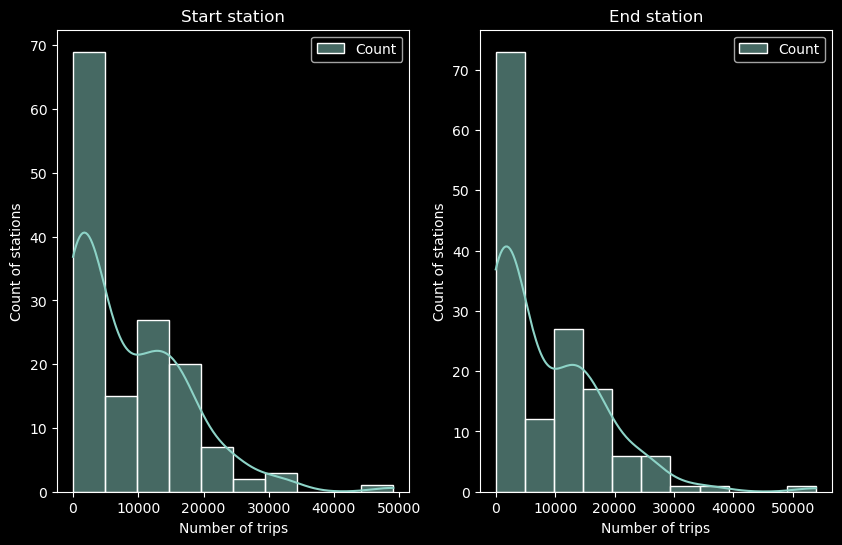

In [69]:
fig,axs=plt.subplots(1,2,figsize=(10,6))
axs[0].set_title("Start station")
axs[1].set_title("End station")
axs[0].set_ylabel("Count of stations")
axs[1].set_ylabel("Count of stations")
axs[0].set_xlabel("Number of trips")
axs[1].set_xlabel("Number of trips")
sns.histplot(data=station_start_list,kde=True,ax=axs[0])
sns.histplot(data=station_end_list,kde=True,ax=axs[1])
plt.show()

In [70]:
#top100_station_list.to_csv("/Users/Yanaorfin/Documents/Academy/top100_station_list.csv",index=False)

STATION MAP

In [71]:
map_station=folium.Map(location=[38.9072,-77.0369],zoom_start=13)

In [72]:
#TOP 50 STATION
top50_start.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="home",prefix='fa',color='lightgreen',icon_color='green')).add_to(map_station),axis=1)
top50_end.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="flag",prefix='fa',color='lightblue',icon_color='blue')).add_to(map_station),axis=1)
map_station

STATION MAP. REGISTERED USERS. MORNING

In [73]:
# REGISTERED. MORNING
map_reg_morning=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_start_registered_morning.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="home",prefix='fa',color='lightgreen',icon_color='green')).add_to(map_reg_morning),axis=1)
top50_end_registered_morning.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="flag",prefix='fa',color='lightblue',icon_color='blue')).add_to(map_reg_morning),axis=1)
map_reg_morning.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_reg_morning.html')
map_reg_morning

ValueError: Location values cannot contain NaNs.

In [ ]:
# REGISTERED. MORNING. ONLY START STATION
map_reg_morning_start=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_start_registered_morning.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="home",prefix='fa',color='lightgreen',icon_color='green')).add_to(map_reg_morning_start),axis=1)
map_reg_morning_start.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_reg_morning_start.html')
map_reg_morning_start


ValueError: Location values cannot contain NaNs.

In [ ]:
# REGISTERED. MORNING. ONLY END STATION
map_reg_morning_end=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_end_registered_morning.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="flag",prefix='fa',color='lightblue',icon_color='blue')).add_to(map_reg_morning_end),axis=1)
map_reg_morning_end

STATION MAP. REGISTERED USERS. EVENING

In [ ]:
map_reg_evening=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_start_registered_evening.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="home",prefix='fa',color='lightgreen',icon_color='green')).add_to(map_reg_evening),axis=1)
top50_end_registered_evening.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="flag",prefix='fa',color='lightblue',icon_color='blue')).add_to(map_reg_evening),axis=1)
map_reg_evening.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_reg_evening.html')
map_reg_evening

STATION MAP. CASUAL USERS. AFTERNOON

In [ ]:
# CASUAL. AFTERNOON. ONLY START STATION
map_cas_start_afternoon=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_start_casual_afternoon.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["Count"],icon=folium.Icon(icon="home",prefix='fa',color='lightgreen',icon_color='green')).add_to(map_cas_start_afternoon),axis=1)
map_cas_start_afternoon.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_cas_start_afternoon.html')
map_cas_start_afternoon

In [ ]:
# CASUAL. AFTERNOON. ONLY END STATION
map_cas_end_afternoon=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_end_casual_afternoon.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["Count"],icon=folium.Icon(icon="flag",prefix='fa',color='lightblue',icon_color='blue')).add_to(map_cas_end_afternoon),axis=1)
map_cas_end_afternoon.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_cas_end_afternoon.html')
map_cas_end_afternoon

In [ ]:
# CASUAL. EVENING. ONLY START STATION
map_start_cas_evening=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_start_casual_evening.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="home",prefix='fa',color='lightgreen',icon_color='green')).add_to(map_start_cas_evening),axis=1)
map_start_cas_evening.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_start_cas_evening.html')
map_start_cas_evening

In [ ]:
# CASUAL. EVENING. ONLY END STATION
map_cas_end_evening=folium.Map(location=[38.9072,-77.0369],zoom_start=13)
top50_end_casual_evening.apply(lambda row:folium.Marker(location=[row["LATITUDE"],row["LONGITUDE"]],popup=row["NAME"],icon=folium.Icon(icon="flag",prefix='fa',color='lightblue',icon_color='blue')).add_to(map_cas_end_evening),axis=1)
map_cas_end_evening.save('/Users/Yanaorfin_1/Documents/Academy/CapitalBikeShare/map_cas_end_evening.html')
map_cas_end_evening

POPULAR ROUTES

In [ ]:
label=["Route","Count"]
routes_list=trips["route"].value_counts(dropna=False).rename_axis("Route").reset_index(name='Count')

In [ ]:
routes_list.describe()

,Count
count,12066.000000
mean,101.671391
std,221.943157
min,1.000000
25%,4.000000
50%,20.000000
75%,106.000000
max,4441.000000


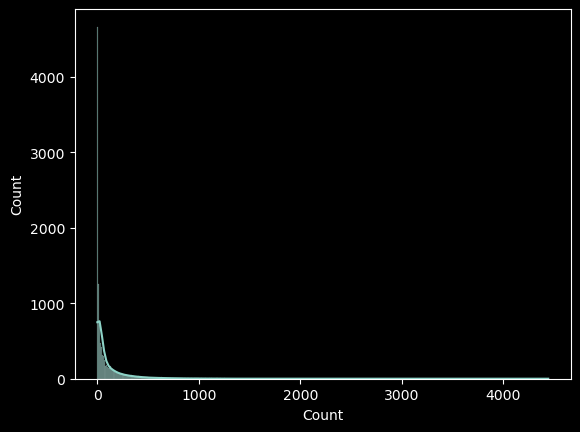

In [ ]:
sns.histplot(data=routes_list,x="Count",kde=True)
plt.show()

In [ ]:
# THE MOST POPULAR ROUTES
popular_routes=routes_list[routes_list['Count']>=126]

In [ ]:
popular_routes.describe()

,Count
count,2702.000000
mean,370.285714
std,351.778761
min,126.000000
25%,175.000000
50%,258.000000
75%,422.500000
max,4441.000000


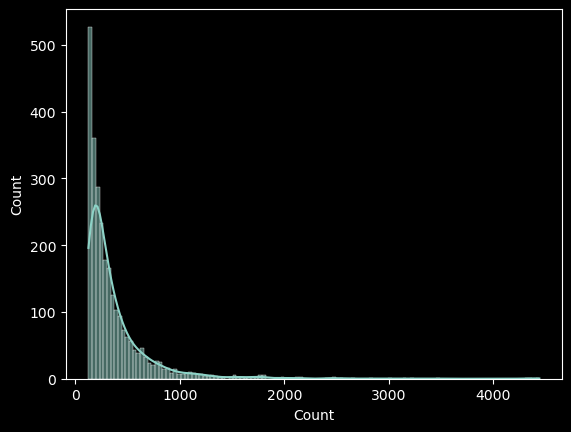

In [ ]:
sns.histplot(data=popular_routes,x="Count",kde=True)
plt.show()

TOP ROUTS BY USER GROUPS & DAY TIME 

In [ ]:
#TOP routs  registered users 

route_registered_morning=registered_morning["route"].str.split(' - ', 1, expand=True).value_counts(dropna=False).reset_index(name='Count')
route_registered_morning.rename(columns={0: 'Start station', 1: 'End station'}, inplace=True)
route_registered_morning['Route number'] = range(1, len(route_registered_morning) + 1)
route_registered_morning_melt=pd.melt(route_registered_morning,id_vars=["Count","Route number"],value_vars=["Start station","End station"])
route_registered_morning_melt.rename(columns={"variable": 'Station type',"value":"NAME"}, inplace=True)


route_registered_morning_loc=pd.merge(route_registered_morning_melt,station_loc,on="NAME",how="left")
top5_route_registered_morning=route_registered_morning_loc.sort_values(by=["Count"],ascending=False).iloc[0:10,:]

In [ ]:
top5_route_registered_morning.head(20)

,Count,Route number,Station type,NAME,X,Y,OBJECTID,LATITUDE,LONGITUDE,STATION_TYPE,STATION_ID,STATION_STATUS
0,1587,1,Start station,Lincoln Park / 13th & East Capitol St NE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8136,1587,1,End station,Eastern Market Metro / Pennsylvania Ave & 7th ...,-76.995800,38.884300,NaN,38.884300,-76.995800,classic,NaN,NaN
8137,1366,2,End station,Columbus Circle / Union Station,-77.004936,38.896969,68794627.0,38.896960,-77.004930,classic,113.0,active
1,1366,2,Start station,13th & D St NE,-76.987633,38.894843,68794616.0,38.894832,-76.987633,classic,101.0,active
8138,1236,3,End station,Massachusetts Ave & Dupont Circle NW,-77.044404,38.910104,68794566.0,38.910100,-77.044400,classic,51.0,active
2,1236,3,Start station,14th & V St NW,-77.032093,38.917774,68794532.0,38.917765,-77.032096,classic,15.0,active
8139,1090,4,End station,Massachusetts Ave & Dupont Circle NW,-77.044404,38.910104,68794566.0,38.910100,-77.044400,classic,51.0,active
3,1090,4,Start station,New Hampshire Ave & T St NW,-77.038250,38.915556,68794617.0,38.915544,-77.038252,classic,102.0,active
5,1054,6,Start station,Crystal City Metro / 18th & Bell St,-77.051699,38.857789,68794526.0,38.857785,-77.051698,classic,8.0,active
8141,1054,6,End station,27th & Crystal Dr,-77.051519,38.848475,68794527.0,38.848466,-77.051514,NaN,NaN,NaN
